# SegNet  
- Pytorch로 논문 구현  
- Data: CamVid (from Kaggle)
    - Train: 369개, Valid: 100개, Test: 232개
    
- accuracy를 측정할 metric으로는 mIoU를 사용  

# Packages and Modules

In [1]:
# packages and modules
import os
import time
import cv2
import random
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from glob import glob
from PIL import Image
from tqdm.notebook import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.init as init
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.models as models
from torch.optim.lr_scheduler import ReduceLROnPlateau, StepLR, MultiStepLR, CyclicLR
from torch.utils.data import Dataset, DataLoader
from torchsummary import summary

from pytorchtools import EarlyStopping, CheckPoint, Metrics
from segnet_utils import load_image_with_resize

In [2]:
warnings.filterwarnings('ignore')
%matplotlib inline
plt.rcParams['figure.figsize'] = [10,7]

# Load Data

In [3]:
# 클래스 디렉토리 데이터 불러오기
data = pd.read_csv('./camvid/11_class_dict.csv', index_col=0)
data

,r,g,b
name,,,
Sky,128,128,128
Building,128,0,0
Pole,192,192,128
Road,128,64,128
Sidewalk,0,0,192
Tree,128,128,0
SignSymbol,192,128,128
Fence,64,64,128
Car,64,0,128


In [4]:
rgb_data = {name:list(data.loc[name, :]) for name in data.index}
rgb_array = {idx:np.array(rgb) for idx, (_, rgb) in enumerate(rgb_data.items())}

In [5]:
width = 224
height = 224
num_classes = len(data) # 12 classes (11 object classes and 1 background)

# cuda setting
device = torch.device('cuda')
print(device)

cuda


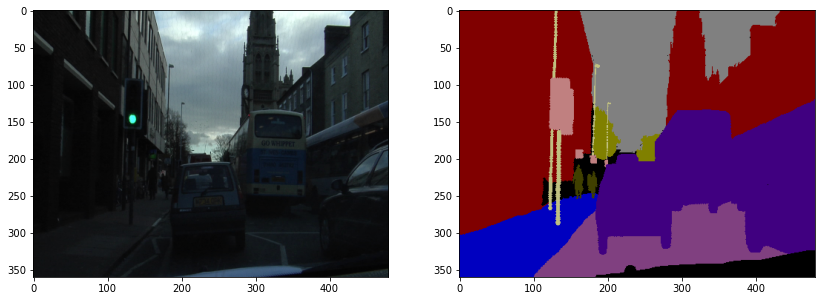

In [6]:
# show sample image
ex1 = Image.open('./camvid/train/train_images/0001TP_006690.png')
ex2 = Image.open('./camvid/train/train_labels/0001TP_006690_L.png')
plt.figure(figsize=(14,6))
plt.subplot(121)
plt.imshow(ex1)
plt.subplot(122)
plt.imshow(ex2)
plt.show()

In [7]:
# load image data with resize
path = './camvid/'
train_image, train_label = load_image_with_resize(path, 
                                                  n_pixel_L=width, n_pixel_R=height, 
                                                  subset='train')
valid_image, valid_label = load_image_with_resize(path, 
                                                  n_pixel_L=width, n_pixel_R=height, 
                                                  subset='valid')
test_image, test_label = load_image_with_resize(path, 
                                                n_pixel_L=width, n_pixel_R=height, 
                                                subset='test')

  0%|          | 0/367 [00:00<?, ?it/s]

  0%|          | 0/367 [00:00<?, ?it/s]

  0%|          | 0/101 [00:00<?, ?it/s]

  0%|          | 0/101 [00:00<?, ?it/s]

  0%|          | 0/233 [00:00<?, ?it/s]

  0%|          | 0/233 [00:00<?, ?it/s]

In [8]:
# data 합치기 (총 701장)
data_images = np.concatenate((train_image,valid_image,test_image), axis=0)
data_labels = np.concatenate((train_label,valid_label,test_label), axis=0)

# shuffling
idx = np.arange(len(data_images))
np.random.shuffle(idx)
shuffled_images = data_images[idx]
shuffled_labels = data_labels[idx]

# divide train, valid and test data set
# train data: 500장
train_image = shuffled_images[:500]
train_label = shuffled_labels[:500]
# valid data: 100장
valid_image = shuffled_images[500:600]
valid_label = shuffled_labels[500:600]
# test data: 101장
test_image = shuffled_images[600:]
test_label = shuffled_labels[600:]

In [9]:
# image to 12 classes mask
def image2mask(labels):
    semantic_map = []
    for color in tqdm(list(rgb_data.values())):
        equality = np.equal(labels, color)
        class_map = np.all(equality, axis=-1)
        semantic_map.append(class_map)
    semantic_map = np.stack(semantic_map, axis=-1)
    return np.float32(semantic_map)

train_mask = image2mask(train_label)
valid_mask = image2mask(valid_label)
test_mask = image2mask(test_label)

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

In [10]:
# custom data set
class CamVidDataset(Dataset):
    def __init__(self, transforms_, subset='train', predict_train=False):
        self.transforms = transforms.Compose(transforms_)
        if subset=='train':
            if predict_train:
                self.images = train_image[:100]
                self.labels = train_mask[:100]
            else:
                self.images = train_image
                self.labels = train_mask
        elif subset=='valid':
            self.images = valid_image
            self.labels = valid_mask
        else:
            self.images = test_image
            self.labels = test_mask
            
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        images = self.images[idx]
        labels = self.labels[idx]
        return self.transforms(images), self.transforms(labels)

In [11]:
batch_size = 12

transforms_ = [
    transforms.ToTensor(),
]

train_loader = DataLoader(
    CamVidDataset(transforms_=transforms_, subset='train'),
    batch_size=batch_size,
    shuffle=True,
    drop_last=True
)

valid_loader = DataLoader(
    CamVidDataset(transforms_=transforms_, subset='valid'),
    batch_size=len(valid_image),
    shuffle=True,
    drop_last=True
)

# Median Frequency Balancing

In [12]:
# class balance of train data set 
train_class_labels = list(rgb_data.keys())
train_class_count = [2925992, 4164714, 113525, 5769970, 771679, 1666212, 191065, 195738,
                     1040037, 97657, 48378, 607456]
print(train_class_labels)

['Sky', 'Building', 'Pole', 'Road', 'Sidewalk', 'Tree', 'SignSymbol', 'Fence', 'Car', 'Pedestrian', 'Bicyclist', 'unlabelled']


In [13]:
# median frequency balancing
weights = torch.tensor(train_class_count, dtype=torch.float32)
median_weights = weights.median()
median_frequency_balancing = median_weights/weights
median_frequency_balancing

tensor([ 0.2076,  0.1459,  5.3509,  0.1053,  0.7872,  0.3646,  3.1793,  3.1034,
         0.5841,  6.2203, 12.5565,  1.0000])

## Build Model

In [14]:
# load pre-trained vgg16
vgg16 = models.vgg16(pretrained=True)

In [15]:
# define encoder block module using pre-trained vgg16
class EncoderBlock(nn.Module):
    def __init__(self, index):
        super(EncoderBlock, self).__init__()
        # build encoder network (Conv + BN + ReLU)
        self.block = nn.Sequential(
            vgg16.features[index],
            nn.BatchNorm2d(vgg16.features[index].out_channels),
            nn.ReLU(inplace=True),
        )
                
    def forward(self, x):
        return self.block(x)

In [16]:
# define encoder block module
class DecoderBlock(nn.Module):
    def __init__(self, in_dim, out_dim):
        super(DecoderBlock, self).__init__()
        # build decoder network (Conv + BN + ReLU)
        self.block = nn.Sequential(
            nn.Conv2d(in_dim, out_dim, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_dim),
            nn.ReLU(inplace=True),
        )
        
    def forward(self, x):
        return self.block(x)

In [17]:
class SegNet(nn.Module):
    def __init__(self, num_filters=64, in_dim=3, out_dim=num_classes):
        super(SegNet, self).__init__()
        # define convolution layer indices of vgg16 
        self.vgg_conv_index = [0,2,5,7,10,12,14,17,19,21,24,26,28]
        
        ### stage 1, 2 has 2 of Conv layer + Batch Norm layer + ReLU activation layer
        ### stage 3, 4, 5 has 3 of Conv layer + Batch Norm layer + ReLU activation layer
        
        ######################### ENCODER #########################
        # define max pooling layer
        self.MaxPooling = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)
        # first encoding
        self.encoder1 = EncoderBlock(self.vgg_conv_index[0])
        self.encoder2 = EncoderBlock(self.vgg_conv_index[1])
        # second encoding
        self.encoder3 = EncoderBlock(self.vgg_conv_index[2])
        self.encoder4 = EncoderBlock(self.vgg_conv_index[3])
        # third encoding
        self.encoder5 = EncoderBlock(self.vgg_conv_index[4])
        self.encoder6 = EncoderBlock(self.vgg_conv_index[5])
        self.encoder7 = EncoderBlock(self.vgg_conv_index[6])
        # fourth encoding
        self.encoder8 = EncoderBlock(self.vgg_conv_index[7])
        self.encoder9 = EncoderBlock(self.vgg_conv_index[8])
        self.encoder10 = EncoderBlock(self.vgg_conv_index[9])
        # fifth encoding
        self.encoder11 = EncoderBlock(self.vgg_conv_index[10])
        self.encoder12 = EncoderBlock(self.vgg_conv_index[11])
        self.encoder13 = EncoderBlock(self.vgg_conv_index[12])
        
        ###########################################################
        ######################## SYMMETRIC ########################
        ###########################################################
        
        ######################### DECODER #########################
        # define max-pooling indices layer
        self.MaxUnPooling = nn.MaxUnpool2d(kernel_size=2, stride=2)
        # first decoding
        self.decoder1 = DecoderBlock(num_filters*8, num_filters*8)
        self.decoder2 = DecoderBlock(num_filters*8, num_filters*8)
        self.decoder3 = DecoderBlock(num_filters*8, num_filters*8)
        # second decoding
        self.decoder4 = DecoderBlock(num_filters*8, num_filters*8)
        self.decoder5 = DecoderBlock(num_filters*8, num_filters*8)
        self.decoder6 = DecoderBlock(num_filters*8, num_filters*4)
        # third decoding
        self.decoder7 = DecoderBlock(num_filters*4, num_filters*4)
        self.decoder8 = DecoderBlock(num_filters*4, num_filters*4)
        self.decoder9 = DecoderBlock(num_filters*4, num_filters*2)
        # fourth decoding
        self.decoder10 = DecoderBlock(num_filters*2, num_filters*2)
        self.decoder11 = DecoderBlock(num_filters*2, num_filters)
        # fifth decoding
        self.decoder12 = DecoderBlock(num_filters, num_filters)
        self.decoder13 = DecoderBlock(num_filters, out_dim)
        # softmax classifier
        self.classifier = nn.Softmax()
        
    def forward(self, x):
        ######################### ENCODING #########################
        # stage 1
        size1 = x.size()
        x = self.encoder1(x)
        x = self.encoder2(x)
        x, idx1 = self.MaxPooling(x)
        # stage 2
        size2 = x.size()
        x = self.encoder3(x)
        x = self.encoder4(x)
        x, idx2 = self.MaxPooling(x)
        # stage 3
        size3 = x.size()
        x = self.encoder5(x)
        x = self.encoder6(x)
        x = self.encoder7(x)
        x, idx3 = self.MaxPooling(x)
        # stage 4
        size4 = x.size()
        x = self.encoder8(x)
        x = self.encoder9(x)
        x = self.encoder10(x)
        x, idx4 = self.MaxPooling(x)
        # stage 5
        size5 = x.size()
        x = self.encoder11(x)
        x = self.encoder12(x)
        x = self.encoder13(x)
        x, idx5 = self.MaxPooling(x)
        
        ######################### DECODING #########################
        # stage 5
        x = self.MaxUnPooling(x, idx5, output_size=size5)
        x = self.decoder1(x)
        x = self.decoder2(x)
        x = self.decoder3(x)
        # stage 4
        x = self.MaxUnPooling(x, idx4, output_size=size4)
        x = self.decoder4(x)
        x = self.decoder5(x)
        x = self.decoder6(x)
        # stage 3
        x = self.MaxUnPooling(x, idx3, output_size=size3)
        x = self.decoder7(x)
        x = self.decoder8(x)
        x = self.decoder9(x)
        # stage 2
        x = self.MaxUnPooling(x, idx2, output_size=size2)
        x = self.decoder10(x)
        x = self.decoder11(x)
        # stage 1
        x = self.MaxUnPooling(x, idx1, output_size=size1)
        x = self.decoder12(x)
        out = self.decoder13(x)
        # apply softmax activation function
        softmax_output = self.classifier(out)
        
        return out, softmax_output

In [18]:
model = SegNet().to(device)
summary(model, (3,224,224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
       BatchNorm2d-2         [-1, 64, 224, 224]             128
              ReLU-3         [-1, 64, 224, 224]               0
      EncoderBlock-4         [-1, 64, 224, 224]               0
            Conv2d-5         [-1, 64, 224, 224]          36,928
       BatchNorm2d-6         [-1, 64, 224, 224]             128
              ReLU-7         [-1, 64, 224, 224]               0
      EncoderBlock-8         [-1, 64, 224, 224]               0
         MaxPool2d-9  [[-1, 64, 112, 112], [-1, 64, 112, 112]]               0
           Conv2d-10        [-1, 128, 112, 112]          73,856
      BatchNorm2d-11        [-1, 128, 112, 112]             256
             ReLU-12        [-1, 128, 112, 112]               0
     EncoderBlock-13        [-1, 128, 112, 112]               0
           Conv2d-14    

# Set Loss function, Optimizer, learning rate scheduler and early stopping  
- loss : weighted cross entropy loss
$$CE = -\sum y_{true}\log\left({y_{pred}}\right)$$  
$$Weighted\,CE = -\sum w\times y_{true}\log\left({y_{pred}}\right)$$

- class imbalance  
- using median frequency balancing  
$$weight = freq\, median \,/\, freq(c)$$

In [19]:
# set learning rate scheduler to reduce loss
lr = 0.00001
es_save_path = './model/es_checkpoint.pt'
cp_save_path = './model/checkpoint.pt'
loss_func = nn.CrossEntropyLoss(weight=median_frequency_balancing).to(device)
# optimizer = optim.Adam(model.parameters(), lr=lr)
optimizer = optim.NAdam(model.parameters(), lr=lr)
lr_scheduler = ReduceLROnPlateau(optimizer, 'min', patience=20, factor=0.5, verbose=True)
#lr_scheduler = StepLR(optimizer, step_size=50, gamma=0.1)
#lr_scheduler = MultiStepLR(optimizer, milestones=[80,150], gamma=0.5)
# lr_scheduler = CyclicLR(optimizer, base_lr=0.00001, step_size_up=5, max_lr=0.001, mode='triangular2', cycle_momentum=False)
checkpoint = CheckPoint(verbose=True, path=cp_save_path)
early_stopping = EarlyStopping(patience=40, verbose=True, path=es_save_path)
metric = Metrics(n_classes=num_classes, dim=1) # mIoU

# Train Model

In [20]:
# define model training function
def train(model, 
          train_data, 
          validation_data,
          epochs,
          learning_rate_scheduler=False,
          check_point=False,
          early_stop=False,
          model_save_path='./model/last_checkpoint.pt'):
    # create empty list to append losses and miou of train, valid
    loss_list, val_loss_list = [], []
    miou_list, val_miou_list = [], []
    # train the model
    model.train()
    starting = time.time()
    # start training
    for epoch in tqdm(range(epochs)):
        init_time = time.time()
        # train by batch
        for train_images, train_labels in train_data:
            train_images = train_images.to(device)
            train_labels = train_labels.to(device)
            # initialize the gradient to 0
            optimizer.zero_grad()
            
            output_images, _ = model(train_images)
            loss = loss_func(output_images, train_labels)
            train_miou = metric.get_miou(output_images, train_labels)
            # update loss and optimizer
            loss.backward()
            optimizer.step()
            
        end_time = time.time()
        loss_list.append(loss.item())
        miou_list.append(train_miou.item())
        # check epoch, loss, miou and time
        print(f'\n[Epoch {epoch+1}/{epochs}]'
              f'  [Loss: {loss.item():.3f}]'
              f'  [mIoU: {train_miou.item():.3f}]'
              f'  [time: {end_time-init_time:.3f}s]')
                
        # validate the model
        with torch.no_grad():
            for val_images, val_labels in validation_data:
                val_images, val_labels = val_images.to(device), val_labels.to(device)
                
                val_outputs, _ = model(val_images)
                val_loss = loss_func(val_outputs, val_labels)
                val_miou = metric.get_miou(val_outputs, val_labels)
                
                if learning_rate_scheduler:
                    lr_scheduler.step(val_loss)
                
            val_loss_list.append(val_loss.item())
            val_miou_list.append(val_miou.item())
            # check loss and miou of validation
            print(f'[validation loss: {val_loss.item():.3f}]'
                  f'   [validation mIoU: {val_miou.item():.3f}]')
            
        if check_point:
            checkpoint(val_loss, model)
        
        # set early stopping
        if early_stop:
            assert check_point==False
            early_stopping(val_loss, model)
            if early_stopping.early_stop:
                print('\n##########################\n'
                      '##### Early Stopping #####\n'
                      '##########################')
                break
            
    # if we not set early stopping, the model save at the end of training
    if early_stop==False | check_point==False:
        torch.save(model.state_dict(), model_save_path)
        print('Saving model of last epoch')
        
    ending = time.time()
    print(f'\nTotal time for training is {ending-starting:.3f}s\n'
          'Saving model ...')
    
    return model, loss_list, val_loss_list, miou_list, val_miou_list

In [21]:
# model training
EPOCH = 1000

model, train_loss, valid_loss, train_miou, valid_miou = train(
    model,
    train_loader,
    validation_data=valid_loader,
    epochs=EPOCH,
    learning_rate_scheduler=False,
    check_point=True,
    early_stop=False,
)

  0%|          | 0/1000 [00:00<?, ?it/s]


[Epoch 1/1000]  [Loss: 1.079]  [mIoU: 0.032]  [time: 6.082s]
[validation loss: 1.078]   [validation mIoU: 0.030]
Validation loss decreased (inf --> 1.078).  Saving model ...

[Epoch 2/1000]  [Loss: 0.975]  [mIoU: 0.037]  [time: 5.478s]
[validation loss: 1.059]   [validation mIoU: 0.036]
Validation loss decreased (1.078 --> 1.059).  Saving model ...

[Epoch 3/1000]  [Loss: 1.095]  [mIoU: 0.051]  [time: 5.558s]
[validation loss: 1.044]   [validation mIoU: 0.047]
Validation loss decreased (1.059 --> 1.044).  Saving model ...

[Epoch 4/1000]  [Loss: 1.093]  [mIoU: 0.065]  [time: 5.456s]
[validation loss: 1.018]   [validation mIoU: 0.063]
Validation loss decreased (1.044 --> 1.018).  Saving model ...

[Epoch 5/1000]  [Loss: 1.039]  [mIoU: 0.087]  [time: 5.453s]
[validation loss: 0.971]   [validation mIoU: 0.089]
Validation loss decreased (1.018 --> 0.971).  Saving model ...

[Epoch 6/1000]  [Loss: 0.816]  [mIoU: 0.102]  [time: 5.570s]
[validation loss: 0.910]   [validation mIoU: 0.115]
Val


[Epoch 53/1000]  [Loss: 0.241]  [mIoU: 0.596]  [time: 5.509s]
[validation loss: 0.433]   [validation mIoU: 0.489]

[Epoch 54/1000]  [Loss: 0.224]  [mIoU: 0.609]  [time: 5.520s]
[validation loss: 0.427]   [validation mIoU: 0.488]

[Epoch 55/1000]  [Loss: 0.210]  [mIoU: 0.602]  [time: 5.490s]
[validation loss: 0.432]   [validation mIoU: 0.490]

[Epoch 56/1000]  [Loss: 0.217]  [mIoU: 0.571]  [time: 5.507s]
[validation loss: 0.428]   [validation mIoU: 0.493]

[Epoch 57/1000]  [Loss: 0.236]  [mIoU: 0.537]  [time: 5.600s]
[validation loss: 0.434]   [validation mIoU: 0.492]

[Epoch 58/1000]  [Loss: 0.230]  [mIoU: 0.599]  [time: 5.525s]
[validation loss: 0.430]   [validation mIoU: 0.492]

[Epoch 59/1000]  [Loss: 0.229]  [mIoU: 0.602]  [time: 5.495s]
[validation loss: 0.425]   [validation mIoU: 0.499]

[Epoch 60/1000]  [Loss: 0.220]  [mIoU: 0.590]  [time: 5.527s]
[validation loss: 0.429]   [validation mIoU: 0.498]

[Epoch 61/1000]  [Loss: 0.222]  [mIoU: 0.587]  [time: 5.520s]
[validation loss:

[validation loss: 0.423]   [validation mIoU: 0.537]

[Epoch 122/1000]  [Loss: 0.176]  [mIoU: 0.637]  [time: 5.761s]
[validation loss: 0.416]   [validation mIoU: 0.535]

[Epoch 123/1000]  [Loss: 0.167]  [mIoU: 0.697]  [time: 5.939s]
[validation loss: 0.413]   [validation mIoU: 0.534]
Validation loss decreased (0.415 --> 0.413).  Saving model ...

[Epoch 124/1000]  [Loss: 0.171]  [mIoU: 0.666]  [time: 5.834s]
[validation loss: 0.421]   [validation mIoU: 0.537]

[Epoch 125/1000]  [Loss: 0.167]  [mIoU: 0.689]  [time: 5.955s]
[validation loss: 0.418]   [validation mIoU: 0.539]

[Epoch 126/1000]  [Loss: 0.172]  [mIoU: 0.675]  [time: 5.925s]
[validation loss: 0.419]   [validation mIoU: 0.542]

[Epoch 127/1000]  [Loss: 0.195]  [mIoU: 0.688]  [time: 5.932s]
[validation loss: 0.414]   [validation mIoU: 0.537]

[Epoch 128/1000]  [Loss: 0.162]  [mIoU: 0.657]  [time: 5.936s]
[validation loss: 0.418]   [validation mIoU: 0.543]

[Epoch 129/1000]  [Loss: 0.167]  [mIoU: 0.696]  [time: 5.893s]
[validati

[validation loss: 0.420]   [validation mIoU: 0.556]

[Epoch 191/1000]  [Loss: 0.150]  [mIoU: 0.750]  [time: 5.442s]
[validation loss: 0.422]   [validation mIoU: 0.558]

[Epoch 192/1000]  [Loss: 0.163]  [mIoU: 0.677]  [time: 5.446s]
[validation loss: 0.424]   [validation mIoU: 0.559]

[Epoch 193/1000]  [Loss: 0.149]  [mIoU: 0.718]  [time: 5.446s]
[validation loss: 0.424]   [validation mIoU: 0.558]

[Epoch 194/1000]  [Loss: 0.151]  [mIoU: 0.717]  [time: 5.438s]
[validation loss: 0.421]   [validation mIoU: 0.556]

[Epoch 195/1000]  [Loss: 0.145]  [mIoU: 0.729]  [time: 5.437s]
[validation loss: 0.425]   [validation mIoU: 0.558]

[Epoch 196/1000]  [Loss: 0.142]  [mIoU: 0.724]  [time: 5.447s]
[validation loss: 0.427]   [validation mIoU: 0.560]

[Epoch 197/1000]  [Loss: 0.138]  [mIoU: 0.728]  [time: 5.439s]
[validation loss: 0.426]   [validation mIoU: 0.559]

[Epoch 198/1000]  [Loss: 0.143]  [mIoU: 0.709]  [time: 5.440s]
[validation loss: 0.429]   [validation mIoU: 0.560]

[Epoch 199/1000]  [

[validation loss: 0.425]   [validation mIoU: 0.569]

[Epoch 262/1000]  [Loss: 0.132]  [mIoU: 0.763]  [time: 5.443s]
[validation loss: 0.426]   [validation mIoU: 0.569]

[Epoch 263/1000]  [Loss: 0.133]  [mIoU: 0.766]  [time: 5.438s]
[validation loss: 0.426]   [validation mIoU: 0.569]

[Epoch 264/1000]  [Loss: 0.129]  [mIoU: 0.737]  [time: 5.444s]
[validation loss: 0.429]   [validation mIoU: 0.569]

[Epoch 265/1000]  [Loss: 0.132]  [mIoU: 0.707]  [time: 5.440s]
[validation loss: 0.427]   [validation mIoU: 0.570]

[Epoch 266/1000]  [Loss: 0.137]  [mIoU: 0.711]  [time: 5.424s]
[validation loss: 0.423]   [validation mIoU: 0.570]

[Epoch 267/1000]  [Loss: 0.131]  [mIoU: 0.734]  [time: 5.452s]
[validation loss: 0.431]   [validation mIoU: 0.570]

[Epoch 268/1000]  [Loss: 0.133]  [mIoU: 0.757]  [time: 5.437s]
[validation loss: 0.430]   [validation mIoU: 0.570]

[Epoch 269/1000]  [Loss: 0.126]  [mIoU: 0.737]  [time: 5.439s]
[validation loss: 0.427]   [validation mIoU: 0.570]

[Epoch 270/1000]  [

[validation loss: 0.433]   [validation mIoU: 0.577]

[Epoch 333/1000]  [Loss: 0.134]  [mIoU: 0.753]  [time: 5.434s]
[validation loss: 0.434]   [validation mIoU: 0.575]

[Epoch 334/1000]  [Loss: 0.119]  [mIoU: 0.780]  [time: 5.436s]
[validation loss: 0.435]   [validation mIoU: 0.577]

[Epoch 335/1000]  [Loss: 0.117]  [mIoU: 0.749]  [time: 5.429s]
[validation loss: 0.430]   [validation mIoU: 0.577]

[Epoch 336/1000]  [Loss: 0.119]  [mIoU: 0.737]  [time: 5.433s]
[validation loss: 0.424]   [validation mIoU: 0.577]

[Epoch 337/1000]  [Loss: 0.137]  [mIoU: 0.746]  [time: 5.439s]
[validation loss: 0.427]   [validation mIoU: 0.577]

[Epoch 338/1000]  [Loss: 0.120]  [mIoU: 0.754]  [time: 5.427s]
[validation loss: 0.432]   [validation mIoU: 0.577]

[Epoch 339/1000]  [Loss: 0.123]  [mIoU: 0.767]  [time: 5.426s]
[validation loss: 0.439]   [validation mIoU: 0.580]

[Epoch 340/1000]  [Loss: 0.119]  [mIoU: 0.733]  [time: 5.429s]
[validation loss: 0.431]   [validation mIoU: 0.577]

[Epoch 341/1000]  [

[validation loss: 0.435]   [validation mIoU: 0.584]

[Epoch 404/1000]  [Loss: 0.108]  [mIoU: 0.755]  [time: 5.430s]
[validation loss: 0.434]   [validation mIoU: 0.584]

[Epoch 405/1000]  [Loss: 0.112]  [mIoU: 0.776]  [time: 5.445s]
[validation loss: 0.434]   [validation mIoU: 0.585]

[Epoch 406/1000]  [Loss: 0.113]  [mIoU: 0.750]  [time: 5.442s]
[validation loss: 0.428]   [validation mIoU: 0.585]

[Epoch 407/1000]  [Loss: 0.105]  [mIoU: 0.793]  [time: 5.440s]
[validation loss: 0.433]   [validation mIoU: 0.583]

[Epoch 408/1000]  [Loss: 0.105]  [mIoU: 0.801]  [time: 5.439s]
[validation loss: 0.439]   [validation mIoU: 0.585]

[Epoch 409/1000]  [Loss: 0.107]  [mIoU: 0.776]  [time: 5.449s]
[validation loss: 0.445]   [validation mIoU: 0.588]

[Epoch 410/1000]  [Loss: 0.107]  [mIoU: 0.775]  [time: 5.443s]
[validation loss: 0.445]   [validation mIoU: 0.585]

[Epoch 411/1000]  [Loss: 0.111]  [mIoU: 0.753]  [time: 5.451s]
[validation loss: 0.432]   [validation mIoU: 0.586]

[Epoch 412/1000]  [

[validation loss: 0.443]   [validation mIoU: 0.589]

[Epoch 475/1000]  [Loss: 0.103]  [mIoU: 0.767]  [time: 5.422s]
[validation loss: 0.439]   [validation mIoU: 0.589]

[Epoch 476/1000]  [Loss: 0.105]  [mIoU: 0.755]  [time: 5.435s]
[validation loss: 0.439]   [validation mIoU: 0.591]

[Epoch 477/1000]  [Loss: 0.105]  [mIoU: 0.778]  [time: 5.441s]
[validation loss: 0.442]   [validation mIoU: 0.589]

[Epoch 478/1000]  [Loss: 0.108]  [mIoU: 0.799]  [time: 5.442s]
[validation loss: 0.436]   [validation mIoU: 0.586]

[Epoch 479/1000]  [Loss: 0.099]  [mIoU: 0.763]  [time: 5.434s]
[validation loss: 0.435]   [validation mIoU: 0.589]

[Epoch 480/1000]  [Loss: 0.115]  [mIoU: 0.802]  [time: 5.435s]
[validation loss: 0.435]   [validation mIoU: 0.588]

[Epoch 481/1000]  [Loss: 0.103]  [mIoU: 0.798]  [time: 5.420s]
[validation loss: 0.429]   [validation mIoU: 0.588]

[Epoch 482/1000]  [Loss: 0.099]  [mIoU: 0.787]  [time: 5.441s]
[validation loss: 0.444]   [validation mIoU: 0.591]

[Epoch 483/1000]  [

[validation loss: 0.445]   [validation mIoU: 0.590]

[Epoch 546/1000]  [Loss: 0.092]  [mIoU: 0.794]  [time: 5.429s]
[validation loss: 0.451]   [validation mIoU: 0.592]

[Epoch 547/1000]  [Loss: 0.093]  [mIoU: 0.809]  [time: 5.427s]
[validation loss: 0.439]   [validation mIoU: 0.590]

[Epoch 548/1000]  [Loss: 0.094]  [mIoU: 0.756]  [time: 5.441s]
[validation loss: 0.452]   [validation mIoU: 0.590]

[Epoch 549/1000]  [Loss: 0.090]  [mIoU: 0.801]  [time: 5.424s]
[validation loss: 0.445]   [validation mIoU: 0.593]

[Epoch 550/1000]  [Loss: 0.096]  [mIoU: 0.818]  [time: 5.425s]
[validation loss: 0.448]   [validation mIoU: 0.593]

[Epoch 551/1000]  [Loss: 0.094]  [mIoU: 0.791]  [time: 5.449s]
[validation loss: 0.446]   [validation mIoU: 0.592]

[Epoch 552/1000]  [Loss: 0.090]  [mIoU: 0.807]  [time: 5.429s]
[validation loss: 0.451]   [validation mIoU: 0.590]

[Epoch 553/1000]  [Loss: 0.097]  [mIoU: 0.777]  [time: 5.437s]
[validation loss: 0.453]   [validation mIoU: 0.592]

[Epoch 554/1000]  [

[validation loss: 0.450]   [validation mIoU: 0.596]

[Epoch 617/1000]  [Loss: 0.087]  [mIoU: 0.794]  [time: 5.427s]
[validation loss: 0.452]   [validation mIoU: 0.595]

[Epoch 618/1000]  [Loss: 0.102]  [mIoU: 0.754]  [time: 5.430s]
[validation loss: 0.449]   [validation mIoU: 0.594]

[Epoch 619/1000]  [Loss: 0.090]  [mIoU: 0.803]  [time: 5.445s]
[validation loss: 0.454]   [validation mIoU: 0.597]

[Epoch 620/1000]  [Loss: 0.085]  [mIoU: 0.811]  [time: 5.439s]
[validation loss: 0.451]   [validation mIoU: 0.595]

[Epoch 621/1000]  [Loss: 0.086]  [mIoU: 0.802]  [time: 5.432s]
[validation loss: 0.453]   [validation mIoU: 0.595]

[Epoch 622/1000]  [Loss: 0.088]  [mIoU: 0.796]  [time: 5.440s]
[validation loss: 0.453]   [validation mIoU: 0.596]

[Epoch 623/1000]  [Loss: 0.088]  [mIoU: 0.794]  [time: 5.435s]
[validation loss: 0.450]   [validation mIoU: 0.593]

[Epoch 624/1000]  [Loss: 0.084]  [mIoU: 0.820]  [time: 5.424s]
[validation loss: 0.442]   [validation mIoU: 0.595]

[Epoch 625/1000]  [

[validation loss: 0.441]   [validation mIoU: 0.597]

[Epoch 688/1000]  [Loss: 0.082]  [mIoU: 0.804]  [time: 5.428s]
[validation loss: 0.456]   [validation mIoU: 0.599]

[Epoch 689/1000]  [Loss: 0.081]  [mIoU: 0.793]  [time: 5.437s]
[validation loss: 0.446]   [validation mIoU: 0.598]

[Epoch 690/1000]  [Loss: 0.078]  [mIoU: 0.837]  [time: 5.438s]
[validation loss: 0.446]   [validation mIoU: 0.598]

[Epoch 691/1000]  [Loss: 0.079]  [mIoU: 0.809]  [time: 5.434s]
[validation loss: 0.447]   [validation mIoU: 0.598]

[Epoch 692/1000]  [Loss: 0.079]  [mIoU: 0.807]  [time: 5.430s]
[validation loss: 0.448]   [validation mIoU: 0.599]

[Epoch 693/1000]  [Loss: 0.079]  [mIoU: 0.837]  [time: 5.435s]
[validation loss: 0.450]   [validation mIoU: 0.598]

[Epoch 694/1000]  [Loss: 0.078]  [mIoU: 0.803]  [time: 5.441s]
[validation loss: 0.454]   [validation mIoU: 0.598]

[Epoch 695/1000]  [Loss: 0.079]  [mIoU: 0.813]  [time: 5.447s]
[validation loss: 0.459]   [validation mIoU: 0.597]

[Epoch 696/1000]  [

[validation loss: 0.451]   [validation mIoU: 0.598]

[Epoch 759/1000]  [Loss: 0.075]  [mIoU: 0.832]  [time: 5.432s]
[validation loss: 0.457]   [validation mIoU: 0.600]

[Epoch 760/1000]  [Loss: 0.075]  [mIoU: 0.814]  [time: 5.441s]
[validation loss: 0.450]   [validation mIoU: 0.600]

[Epoch 761/1000]  [Loss: 0.075]  [mIoU: 0.808]  [time: 5.437s]
[validation loss: 0.454]   [validation mIoU: 0.600]

[Epoch 762/1000]  [Loss: 0.076]  [mIoU: 0.825]  [time: 5.433s]
[validation loss: 0.451]   [validation mIoU: 0.601]

[Epoch 763/1000]  [Loss: 0.073]  [mIoU: 0.818]  [time: 5.442s]
[validation loss: 0.452]   [validation mIoU: 0.600]

[Epoch 764/1000]  [Loss: 0.074]  [mIoU: 0.811]  [time: 5.434s]
[validation loss: 0.452]   [validation mIoU: 0.600]

[Epoch 765/1000]  [Loss: 0.075]  [mIoU: 0.825]  [time: 5.439s]
[validation loss: 0.458]   [validation mIoU: 0.601]

[Epoch 766/1000]  [Loss: 0.072]  [mIoU: 0.832]  [time: 5.439s]
[validation loss: 0.458]   [validation mIoU: 0.599]

[Epoch 767/1000]  [

[validation loss: 0.447]   [validation mIoU: 0.601]

[Epoch 830/1000]  [Loss: 0.067]  [mIoU: 0.830]  [time: 5.433s]
[validation loss: 0.461]   [validation mIoU: 0.602]

[Epoch 831/1000]  [Loss: 0.070]  [mIoU: 0.828]  [time: 5.430s]
[validation loss: 0.450]   [validation mIoU: 0.602]

[Epoch 832/1000]  [Loss: 0.074]  [mIoU: 0.798]  [time: 5.430s]
[validation loss: 0.463]   [validation mIoU: 0.602]

[Epoch 833/1000]  [Loss: 0.069]  [mIoU: 0.830]  [time: 5.430s]
[validation loss: 0.458]   [validation mIoU: 0.602]

[Epoch 834/1000]  [Loss: 0.070]  [mIoU: 0.813]  [time: 5.427s]
[validation loss: 0.457]   [validation mIoU: 0.602]

[Epoch 835/1000]  [Loss: 0.069]  [mIoU: 0.806]  [time: 5.437s]
[validation loss: 0.462]   [validation mIoU: 0.601]

[Epoch 836/1000]  [Loss: 0.067]  [mIoU: 0.826]  [time: 5.429s]
[validation loss: 0.451]   [validation mIoU: 0.601]

[Epoch 837/1000]  [Loss: 0.068]  [mIoU: 0.828]  [time: 5.422s]
[validation loss: 0.452]   [validation mIoU: 0.602]

[Epoch 838/1000]  [

[validation loss: 0.460]   [validation mIoU: 0.604]

[Epoch 901/1000]  [Loss: 0.063]  [mIoU: 0.831]  [time: 5.436s]
[validation loss: 0.456]   [validation mIoU: 0.603]

[Epoch 902/1000]  [Loss: 0.063]  [mIoU: 0.827]  [time: 5.425s]
[validation loss: 0.455]   [validation mIoU: 0.604]

[Epoch 903/1000]  [Loss: 0.063]  [mIoU: 0.824]  [time: 5.419s]
[validation loss: 0.458]   [validation mIoU: 0.604]

[Epoch 904/1000]  [Loss: 0.064]  [mIoU: 0.792]  [time: 5.434s]
[validation loss: 0.466]   [validation mIoU: 0.602]

[Epoch 905/1000]  [Loss: 0.060]  [mIoU: 0.851]  [time: 5.435s]
[validation loss: 0.468]   [validation mIoU: 0.602]

[Epoch 906/1000]  [Loss: 0.063]  [mIoU: 0.832]  [time: 5.432s]
[validation loss: 0.451]   [validation mIoU: 0.601]

[Epoch 907/1000]  [Loss: 0.064]  [mIoU: 0.834]  [time: 5.426s]
[validation loss: 0.464]   [validation mIoU: 0.603]

[Epoch 908/1000]  [Loss: 0.065]  [mIoU: 0.830]  [time: 5.440s]
[validation loss: 0.462]   [validation mIoU: 0.603]

[Epoch 909/1000]  [

[validation loss: 0.464]   [validation mIoU: 0.606]

[Epoch 972/1000]  [Loss: 0.071]  [mIoU: 0.841]  [time: 5.437s]
[validation loss: 0.461]   [validation mIoU: 0.606]

[Epoch 973/1000]  [Loss: 0.060]  [mIoU: 0.852]  [time: 5.440s]
[validation loss: 0.460]   [validation mIoU: 0.605]

[Epoch 974/1000]  [Loss: 0.061]  [mIoU: 0.858]  [time: 5.458s]
[validation loss: 0.460]   [validation mIoU: 0.605]

[Epoch 975/1000]  [Loss: 0.058]  [mIoU: 0.844]  [time: 5.429s]
[validation loss: 0.453]   [validation mIoU: 0.606]

[Epoch 976/1000]  [Loss: 0.056]  [mIoU: 0.857]  [time: 5.445s]
[validation loss: 0.459]   [validation mIoU: 0.604]

[Epoch 977/1000]  [Loss: 0.058]  [mIoU: 0.828]  [time: 5.435s]
[validation loss: 0.460]   [validation mIoU: 0.604]

[Epoch 978/1000]  [Loss: 0.057]  [mIoU: 0.846]  [time: 5.436s]
[validation loss: 0.465]   [validation mIoU: 0.606]

[Epoch 979/1000]  [Loss: 0.055]  [mIoU: 0.859]  [time: 5.444s]
[validation loss: 0.463]   [validation mIoU: 0.606]

[Epoch 980/1000]  [

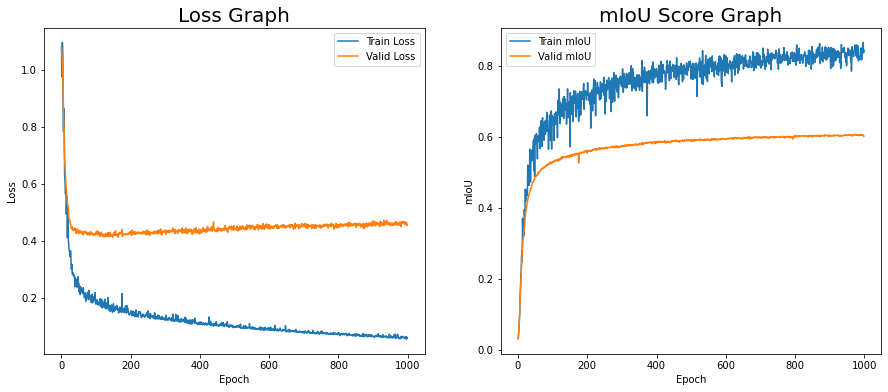

In [53]:
# check losses and miou scores graph
fig, ax = plt.subplots(1,2, figsize=(15,6))
ax[0].set_title('Loss Graph', fontsize=20)
ax[0].plot(np.arange(len(train_loss)), train_loss, label='Train Loss')
ax[0].plot(np.arange(len(valid_loss)), valid_loss, label='Valid Loss')
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Loss')
ax[0].legend(loc='best')
ax[1].set_title('mIoU Score Graph', fontsize=20)
ax[1].plot(np.arange(len(train_miou)), train_miou, label='Train mIoU')
ax[1].plot(np.arange(len(valid_miou)), valid_miou, label='Valid mIoU')
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('mIoU')
ax[1].legend(loc='best')
fig.show()

# Test (마지막에 저장된 모델)

In [23]:
# load test data
test_loader = DataLoader(
    CamVidDataset(transforms_, subset='test'),
    batch_size=len(test_image),
    drop_last=True,
    shuffle=False
)

In [24]:
# test
with torch.no_grad():
    for test_images, test_labels in test_loader:
        test_images = test_images.to(device)
        test_labels = test_labels.to(device)
        # predict
        test_outputs, _ = model(test_images)
        loss = loss_func(test_outputs, test_labels)
        test_miou = metric.get_miou(test_outputs, test_labels)
        print(f'Test Loss: {loss.item():.3f},'
              f'  Test mIoU: {test_miou:.3f}')

Test Loss: 0.454,  Test mIoU: 0.604


In [25]:
# 12 classes channels to 3 RGB channels
def map_class_to_rgb(p):
    return rgb_array[p[0]]

def mask2rgb(images):
    rgb_img_list = []
    for img in tqdm(images):
        img = img.detach().cpu().numpy()
        img = np.transpose(img, (1,2,0))
        img = np.argmax(img, axis=-1)
        rgb_img = np.apply_along_axis(map_class_to_rgb, -1, np.expand_dims(img, -1))
        rgb_img_list.append(rgb_img)
    return np.array(rgb_img_list)

test_result = mask2rgb(test_outputs)

  0%|          | 0/101 [00:00<?, ?it/s]

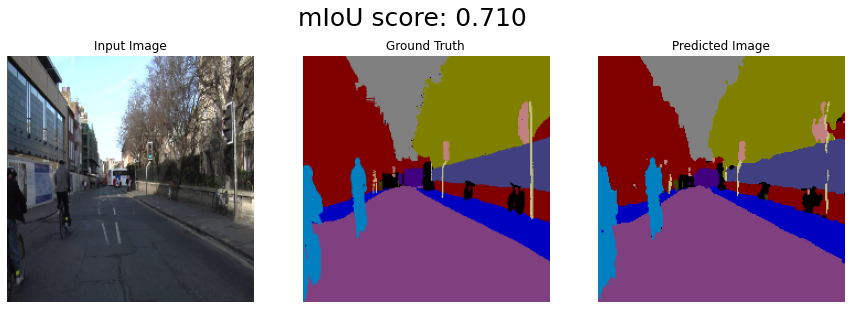

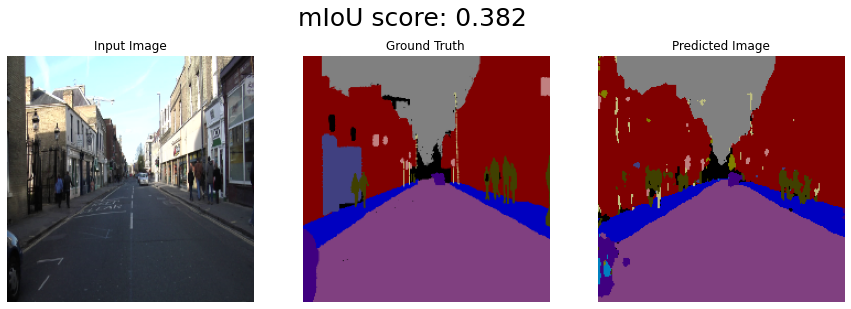

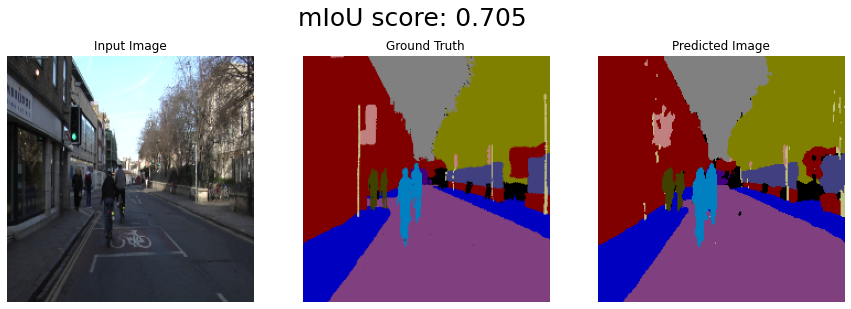

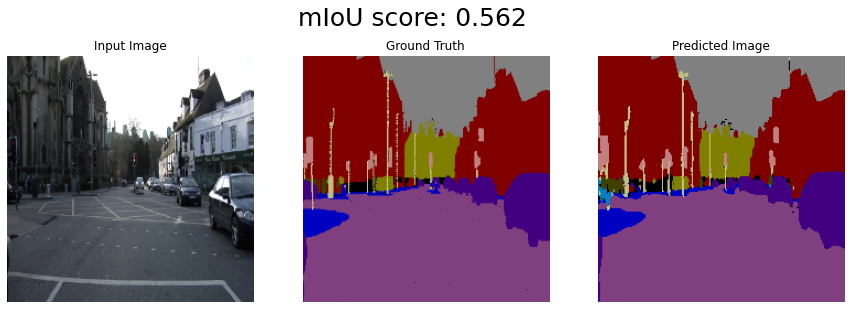

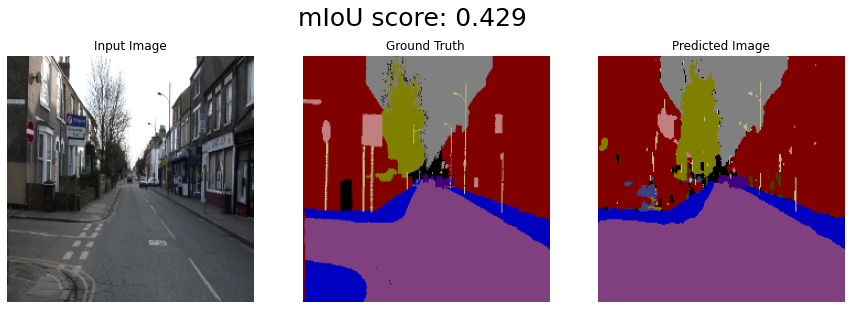

...

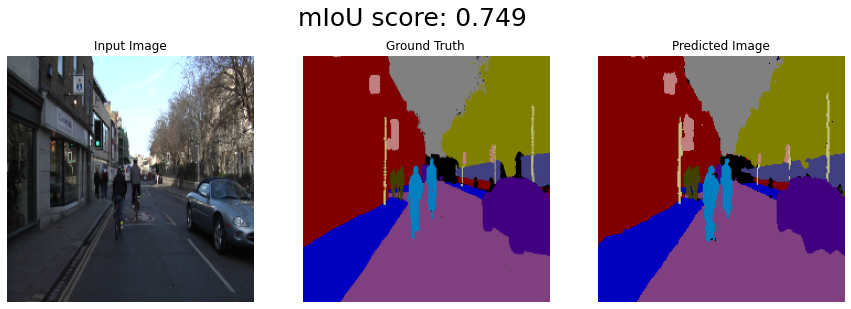

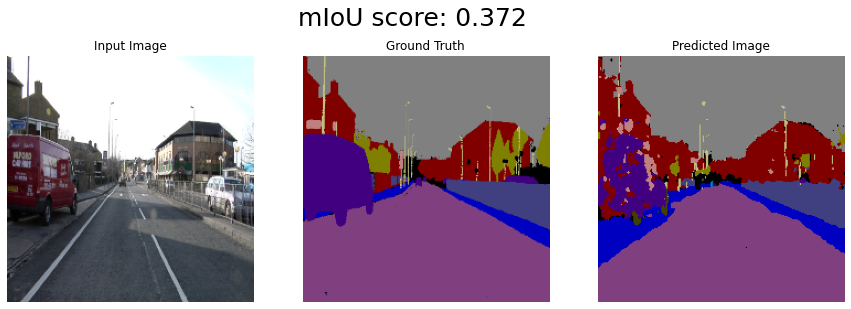

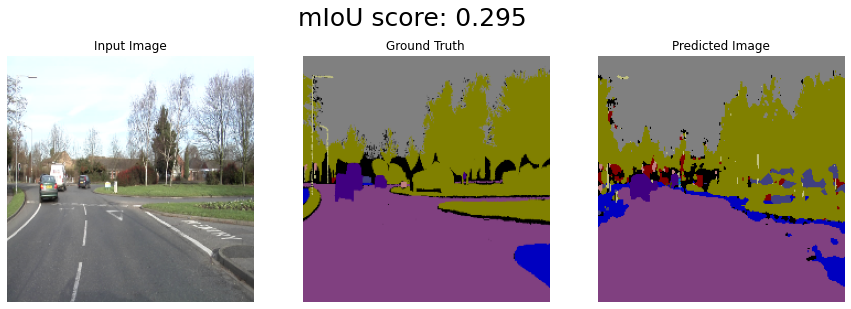

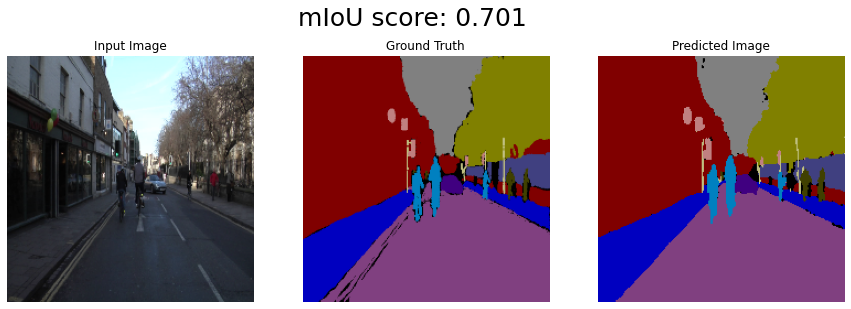

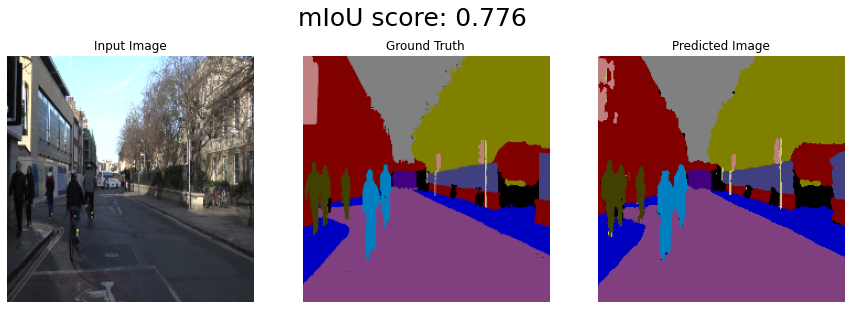

In [26]:
# show test outputs with miou score
test_metric = Metrics(n_classes=num_classes, dim=0)

def show_result(image, label, mask, model_pred, rgb_pred, ncols):
    for i in range(ncols):
        # get miou score
        miou = test_metric.get_miou(mask[i], model_pred[i])
        # plot images
        fig, ax = plt.subplots(1,3, figsize=(15,5))
        fig.suptitle(f'mIoU score: {miou:.3f}', fontsize=25)
        ax[0].imshow(image[i])
        ax[0].axis('off')
        ax[0].set_title('Input Image')
        ax[1].imshow(label[i])
        ax[1].axis('off')
        ax[1].set_title(f'Ground Truth')
        ax[2].imshow(rgb_pred[i])
        ax[2].axis('off')
        ax[2].set_title(f'Predicted Image')
        fig.show()

show_result(test_image, test_label, test_labels, test_outputs, test_result, 20)

In [27]:
# model이 train data에 대해 잘 훈련됐는지 확인
train_loader = DataLoader(
    CamVidDataset(transforms_=transforms_, subset='train', predict_train=True),
    batch_size=100,
    shuffle=False,
    drop_last=True
)

In [28]:
# test
with torch.no_grad():
    for train_images, train_labels in train_loader:
        train_images = train_images.to(device)
        train_labels = train_labels.to(device)
        # predict
        train_outputs, _ = model(train_images)
        loss = loss_func(train_outputs, train_labels)
        test_miou = metric.get_miou(train_outputs, train_labels)
        print(f'Train Loss: {loss.item():.3f},'
              f'  Train mIoU: {test_miou:.3f}')
        
train_result = mask2rgb(train_outputs)

Train Loss: 0.056,  Train mIoU: 0.837


  0%|          | 0/100 [00:00<?, ?it/s]

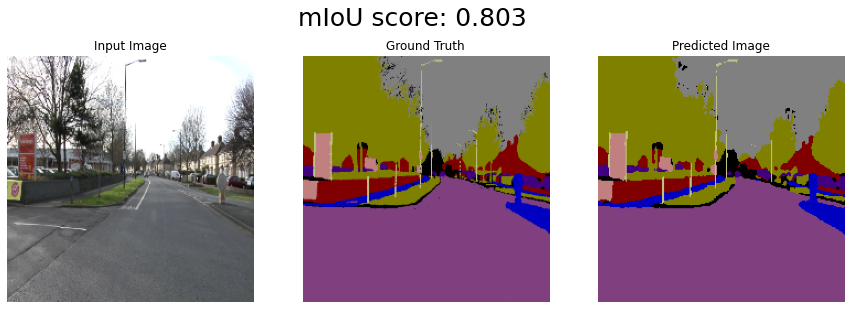

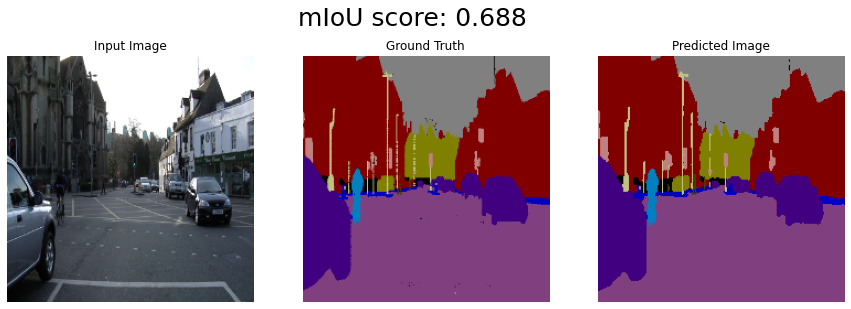

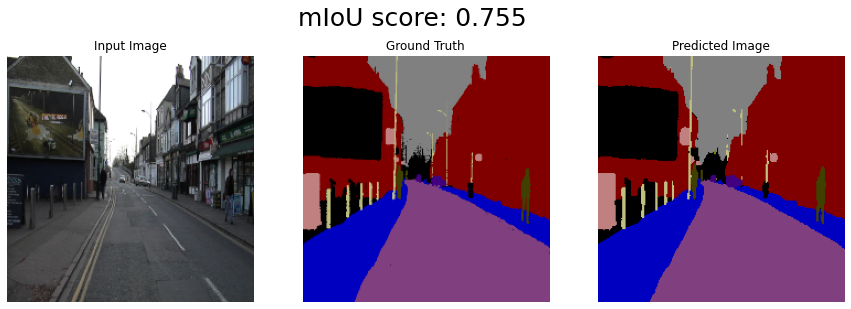

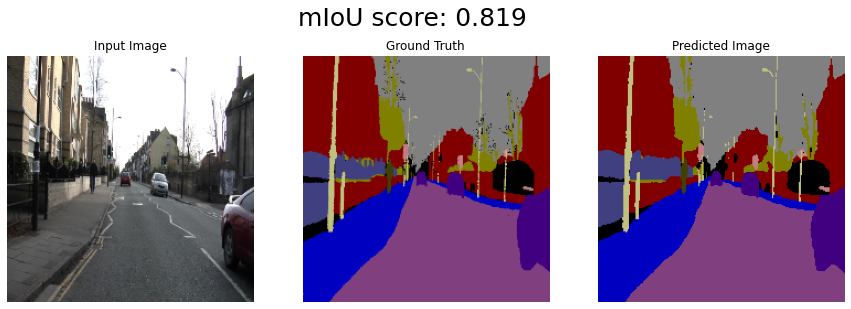

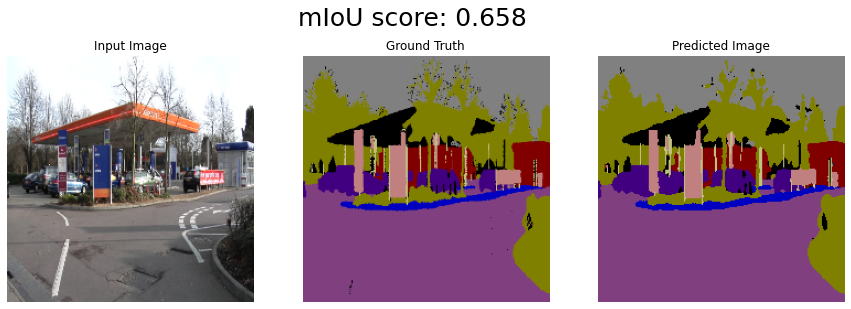

...

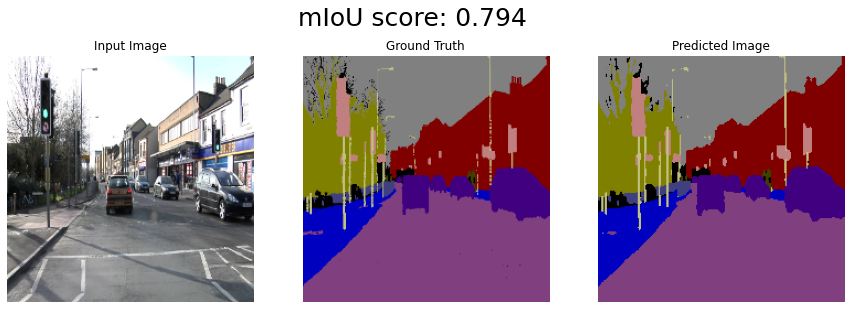

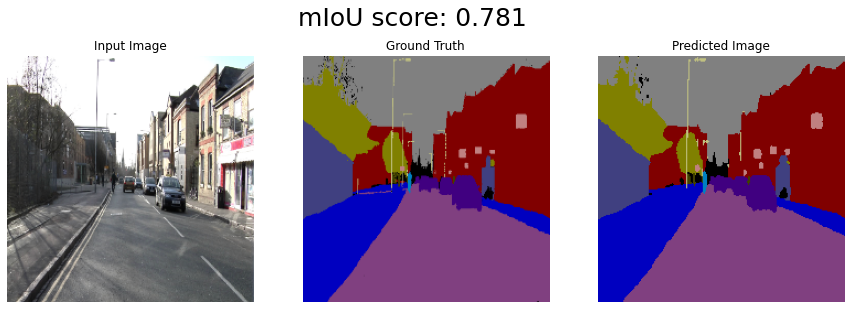

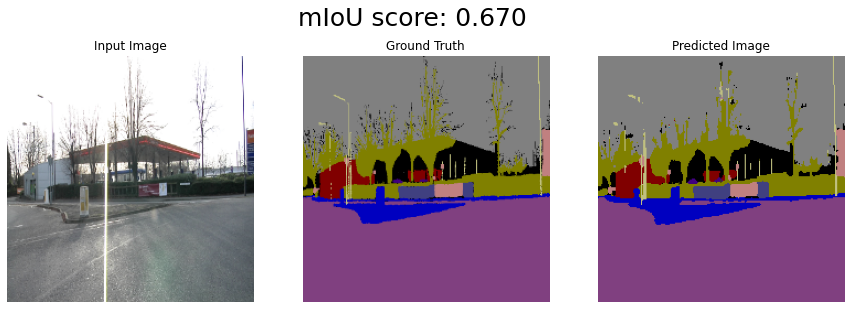

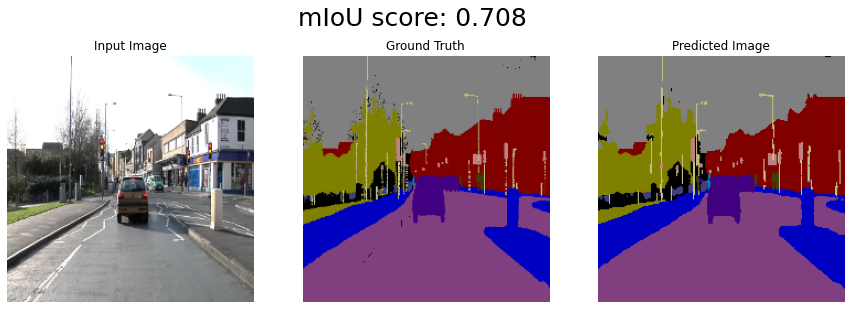

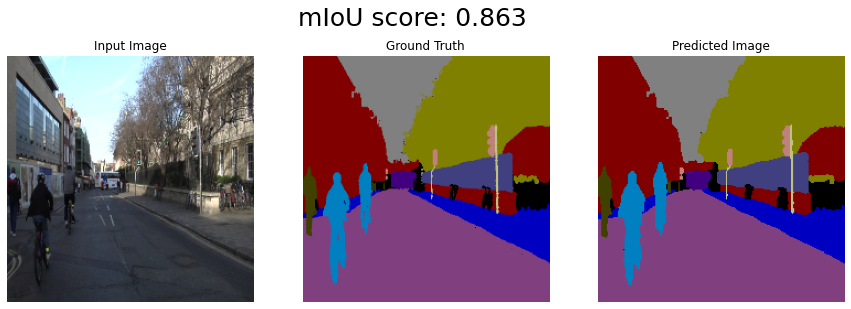

In [29]:
show_result(train_image, train_label, train_labels, train_outputs, train_result, 20)

In [30]:
# load saved model
model = SegNet().to(device)
model.load_state_dict(torch.load('./model/checkpoint.pt'))

<All keys matched successfully>

In [31]:
# load test data
test_loader = DataLoader(
    CamVidDataset(transforms_, subset='test'),
    batch_size=len(test_image),
    drop_last=True,
    shuffle=False
)

In [32]:
# test
with torch.no_grad():
    for test_images, test_labels in test_loader:
        test_images = test_images.to(device)
        test_labels = test_labels.to(device)
        # predict
        test_outputs, _ = model(test_images)
        loss = loss_func(test_outputs, test_labels)
        test_miou = metric.get_miou(test_outputs, test_labels)
        print(f'Test Loss: {loss.item():.3f},'
              f'  Test mIoU: {test_miou:.3f}')

Test Loss: 0.430,  Test mIoU: 0.550


In [33]:
test_result = mask2rgb(test_outputs)

  0%|          | 0/101 [00:00<?, ?it/s]

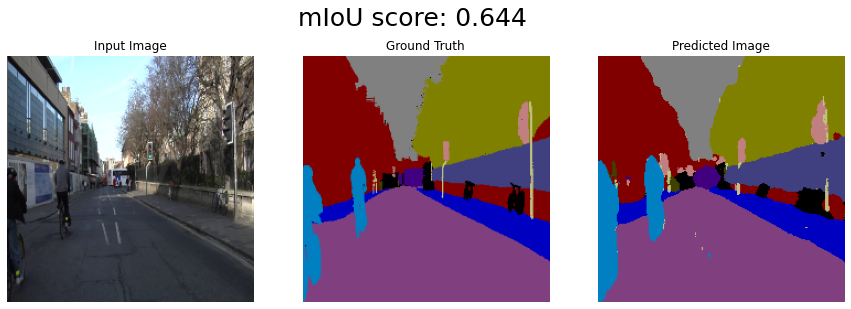

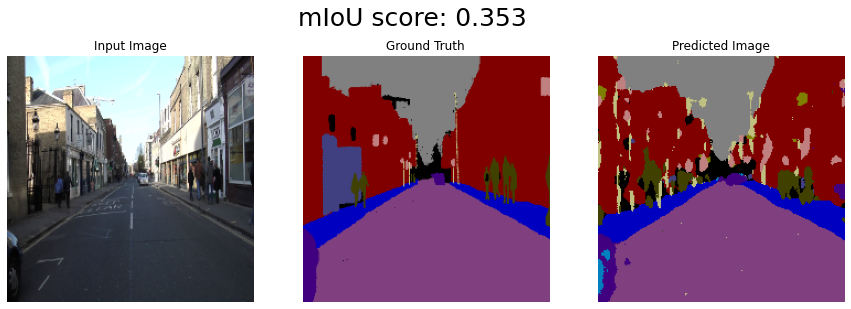

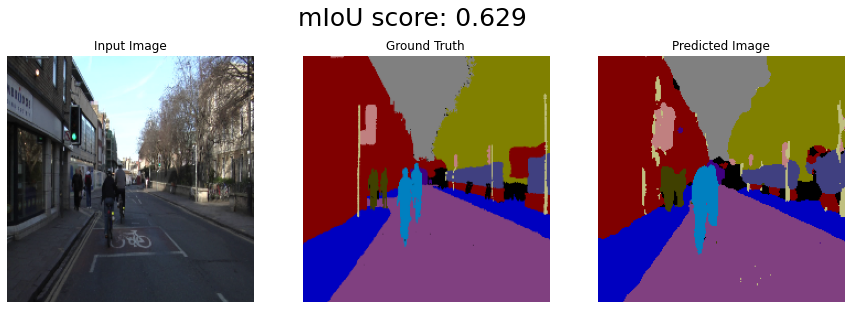

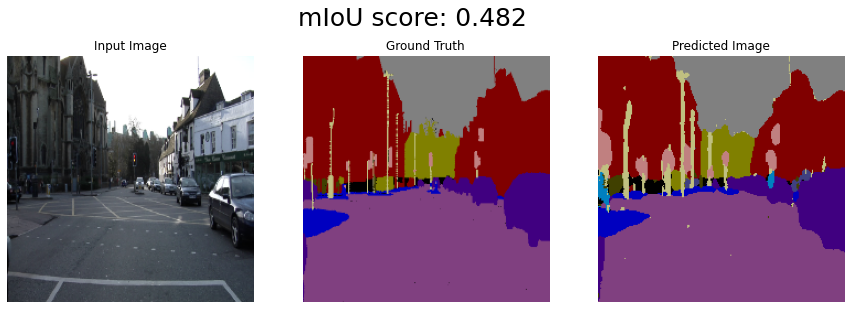

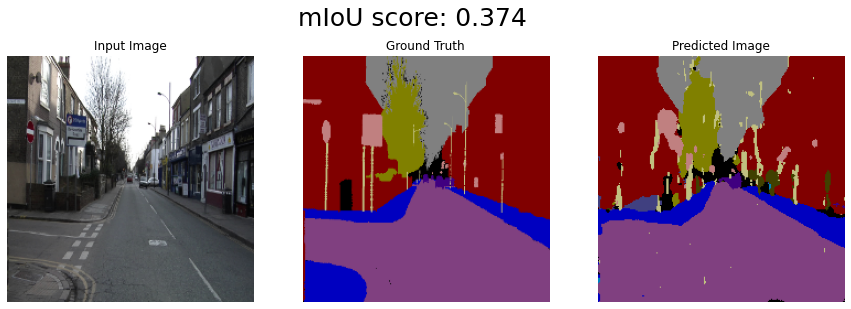

...

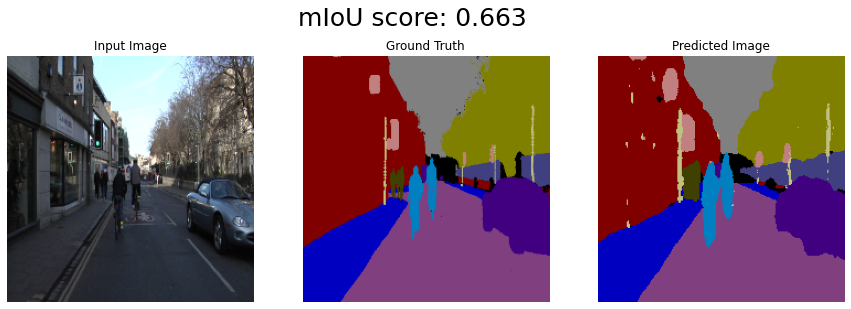

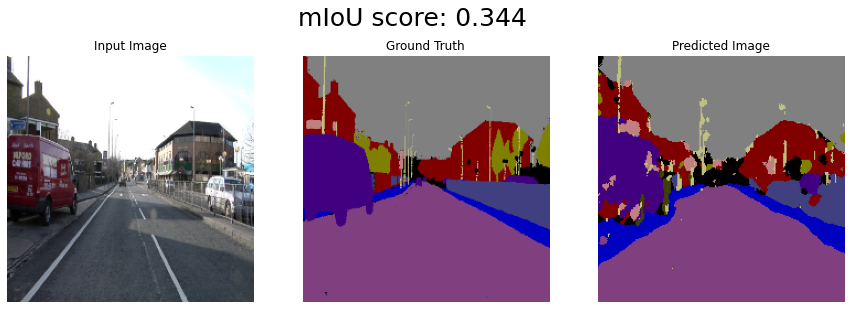

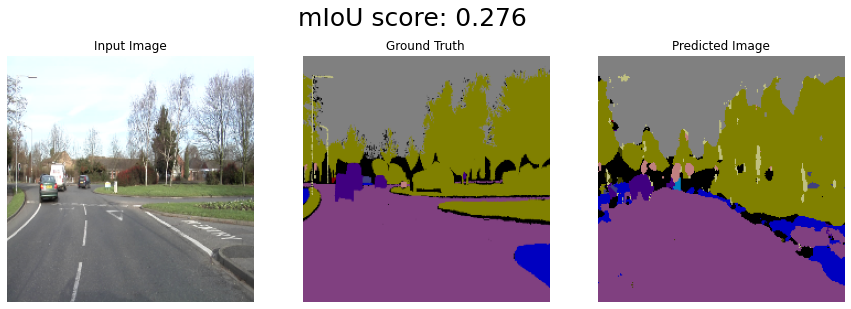

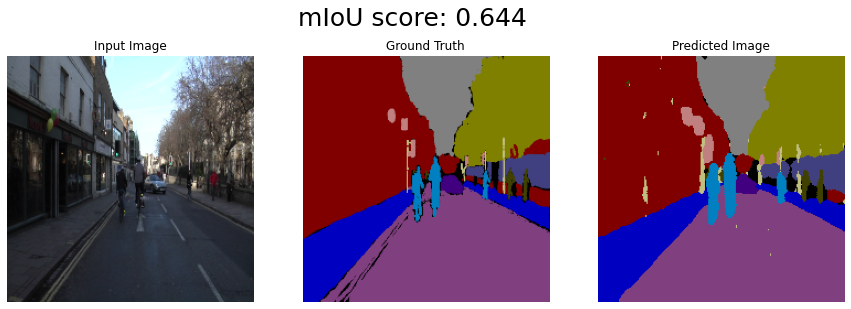

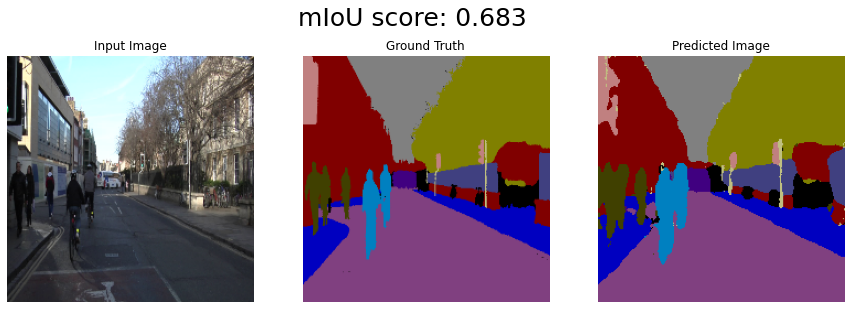

In [34]:
show_result(test_image, test_label, test_labels, test_outputs, test_result, 20)

In [35]:
# model이 train data에 대해 잘 훈련됐는지 확인
train_loader = DataLoader(
    CamVidDataset(transforms_=transforms_, subset='train', predict_train=True),
    batch_size=100,
    shuffle=False,
    drop_last=True
)

In [36]:
# test
with torch.no_grad():
    for train_images, train_labels in train_loader:
        train_images = train_images.to(device)
        train_labels = train_labels.to(device)
        # predict
        train_outputs, _ = model(train_images)
        loss = loss_func(train_outputs, train_labels)
        test_miou = metric.get_miou(train_outputs, train_labels)
        print(f'Train Loss: {loss.item():.3f},'
              f'  Train mIoU: {test_miou:.3f}')
        
train_result = mask2rgb(train_outputs)

Train Loss: 0.152,  Train mIoU: 0.699


  0%|          | 0/100 [00:00<?, ?it/s]

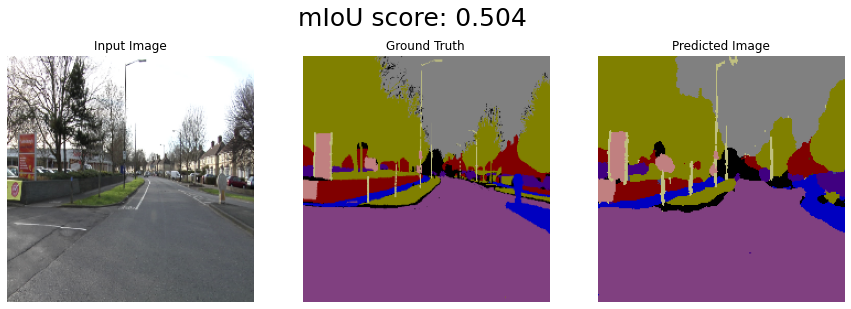

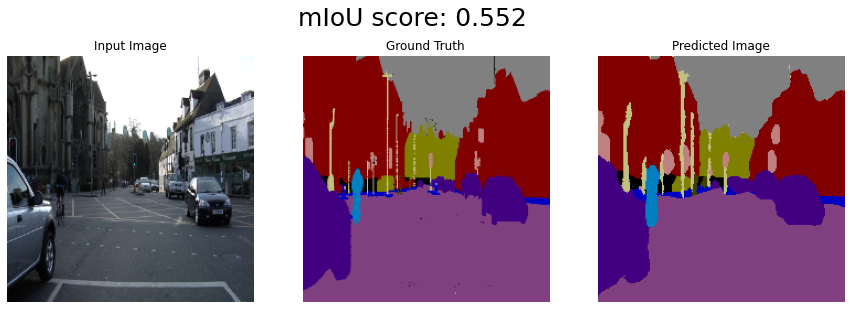

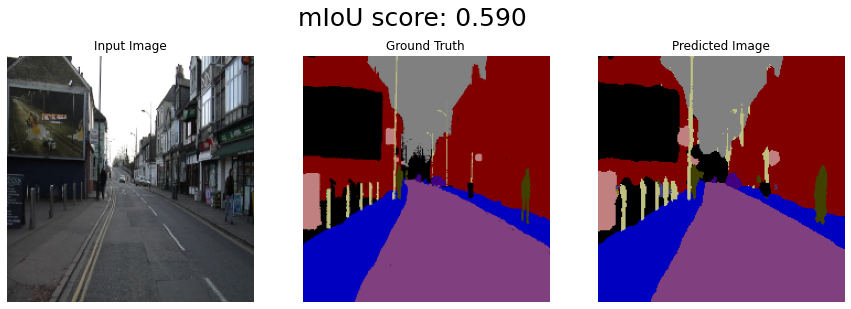

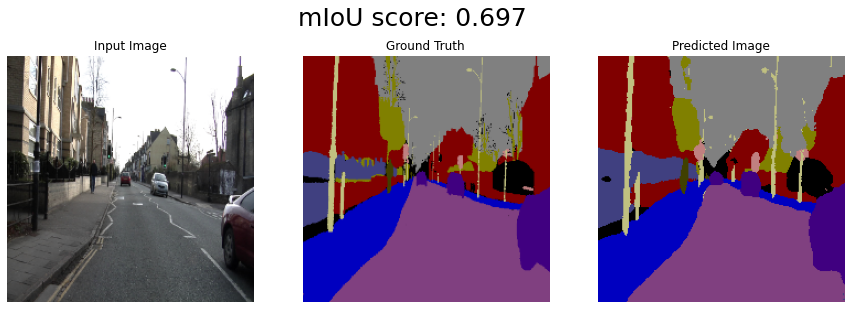

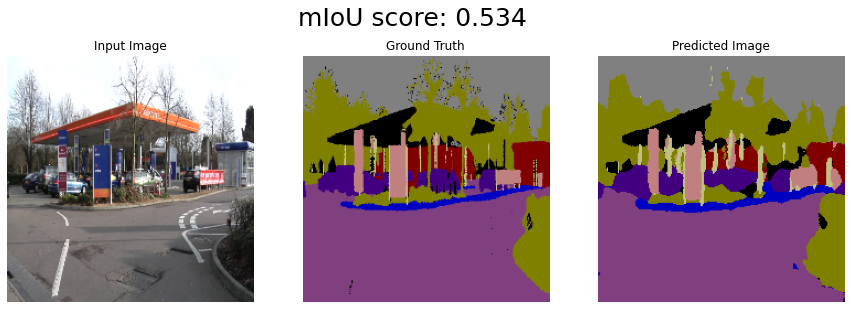

...

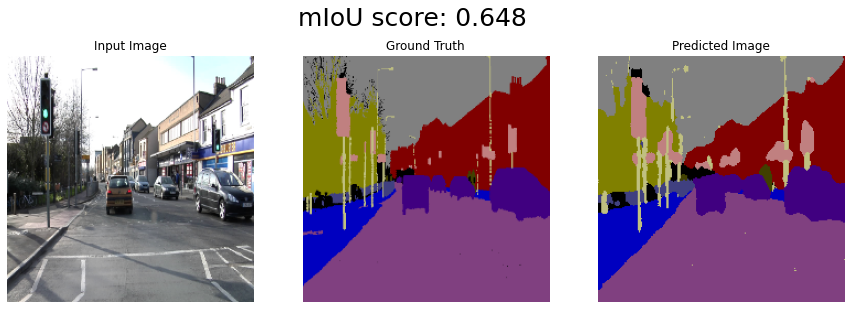

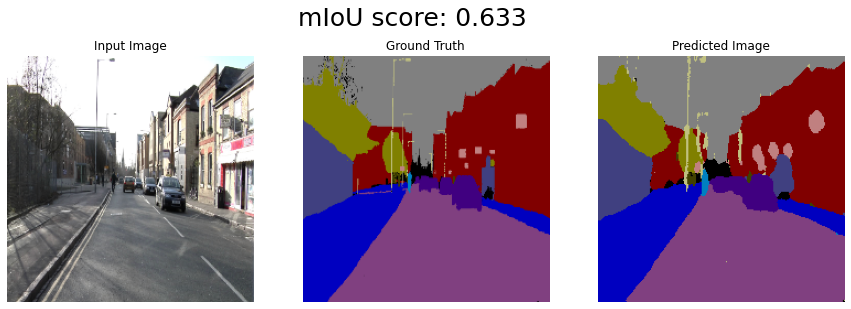

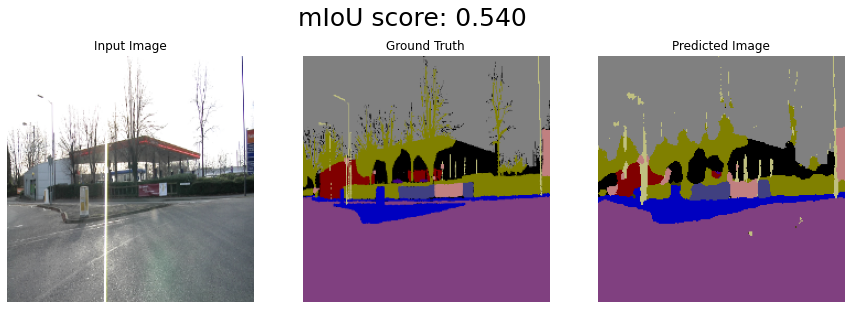

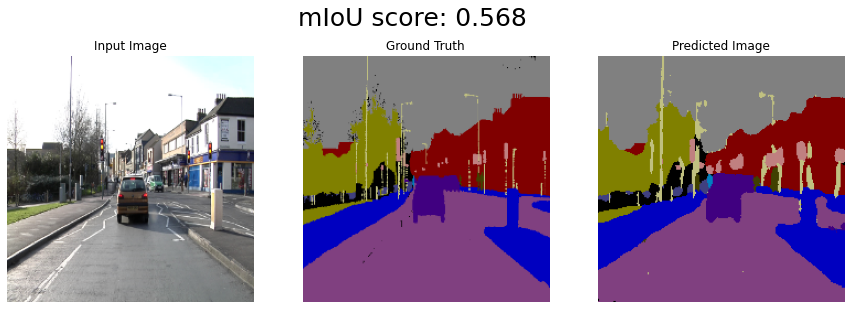

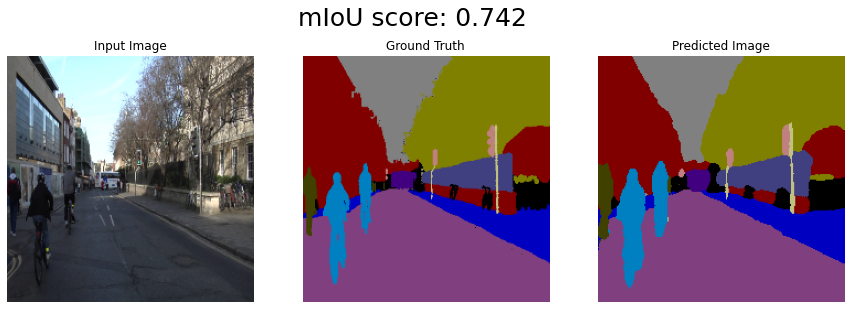

In [37]:
show_result(train_image, train_label, train_labels, train_outputs, train_result, 20)